# London Airbnb Dataset EDA
___

### Importación de librerías

In [1]:
# Librerías de análisis de datos
import numpy as np
import pandas as pd

# Librerías de visualización
import matplotlib.pyplot as plt
import seaborn as sns



### Exploración básica del dataset

Estas son las variables por entrada que contiene el dataset:
+ **id**: número de identificación de la publicación del alojamiento.
+ **name**: nombre de la publicación del alojamiento. 
+ **host_id**: número de identificación del anfitrión.
+ **host_name**: nombre del anfitrión.
+ **neighbourhood_group**: grupo de barrios.
+ **neighbourhood**:barrio o vecindario. 
+ **latitude**: latitud de la ubicación del alojamiento.
+ **longitude**:longitud de la ubicación del alojamiento.
+ **room_type**: tipo de habitación.
+ **price**: precio.
+ **minimum_nights**: noches mínimas.
+ **number_of_reviews**: cuantas personas han revisado el anuncio.
+ **last_review**: última revisión de la publicación.
+ **reviews_per_month**: promedio de revisión por mes.
+ **calculated_host_listings_count**: recuento de host calculados por un propietario/a.
+ **availability_365**: disponibilidad en los 365 días. 

In [2]:
# Una variable para la ruta, buenas prácticas
path_to_data = "./london_airbnb.csv"

# Importamos el dataset y comprobamos que está correcto
df = pd.read_csv(path_to_data)
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365
2,90700,Sunny Notting Hill flat & terrace,491286,Chil,NaN,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268
3,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158
4,92399,"MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...",497366,Andrea & Mark,NaN,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336


In [3]:
# Se muestran las últimas entradas.
df.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
85063,38398365,Beautiful flat in Central London,24782379,Shabnam,NaN,Lambeth,51.48601,-0.12766,Entire home/apt,117,3,2,2019-11-04,2.0,1,59
85064,39869123,Elegant stylish modern house with amazing view!,21145791,Ingrid,NaN,Merton,51.40628,-0.23244,Private room,69,2,0,NaN,NaN,2,113
85065,39869214,Holland Road - Kensington Olympia,251922260,Christian,NaN,Hammersmith and Fulham,51.50244,-0.21547,Entire home/apt,90,3,0,NaN,NaN,4,63
85066,39869249,Functional single room 18 min to London Bridge,255372486,Nudrat,NaN,Bromley,51.35742,0.10764,Private room,30,2,0,NaN,NaN,4,1
85067,39869282,"EXQUISITE APARTMENT, PEACEFUL ENVIRONMENT IN SOHO",210531062,Radi,NaN,Westminster,51.51090,-0.12480,Entire home/apt,187,1,0,NaN,NaN,1,311


In [4]:
#Cantidad de entradas y columnas. 
df.shape

(85068, 16)

Se observa: 
+ 16 columnas. 
+ 85068 entradas.

In [5]:
# Información sobre el dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85068 entries, 0 to 85067
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              85068 non-null  int64  
 1   name                            85043 non-null  object 
 2   host_id                         85068 non-null  int64  
 3   host_name                       85056 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   85068 non-null  object 
 6   latitude                        85068 non-null  float64
 7   longitude                       85068 non-null  float64
 8   room_type                       85068 non-null  object 
 9   price                           85068 non-null  int64  
 10  minimum_nights                  85068 non-null  int64  
 11  number_of_reviews               85068 non-null  int64  
 12  last_review                     

Se observa:
+ La columna "neighbourhood_group" se encuentra vacía por lo que no se considerará por falta de datos.
+ EL resto de columnas, en su mayoría, se encuentran completas. A excepción de las columnas: reviews_per_month, last_review, name y host_name.

In [6]:
#Conteo de datos faltantes por columna. 
df.isnull().sum(axis = 0)

id                                    0
name                                 25
host_id                               0
host_name                            12
neighbourhood_group               85068
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       20006
reviews_per_month                 20006
calculated_host_listings_count        0
availability_365                      0
dtype: int64

Se observa:
+ Las columnas con más datos faltantes son last_review y reviews_per_month, la cantidad es significativa. 

### Creación de nueva tabla
___

In [7]:
# Creando nueva tabla "df_londres" descartando columnas:
df_londres = df.drop(columns=["neighbourhood_group","id", "name","host_id","host_name"])
df_londres.head()

,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336
1,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365
2,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268
3,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158
4,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336


In [8]:
# Se comprueba la eliminación de columnas.
df_londres.shape

(85068, 11)

Se observa:
+ Se redujo de 16 a 11 columnas.

In [9]:
# Información de nueva tabla "df_londres":
df_londres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85068 entries, 0 to 85067
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood                   85068 non-null  object 
 1   latitude                        85068 non-null  float64
 2   longitude                       85068 non-null  float64
 3   room_type                       85068 non-null  object 
 4   price                           85068 non-null  int64  
 5   minimum_nights                  85068 non-null  int64  
 6   number_of_reviews               85068 non-null  int64  
 7   last_review                     65062 non-null  object 
 8   reviews_per_month               65062 non-null  float64
 9   calculated_host_listings_count  85068 non-null  int64  
 10  availability_365                85068 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 7.1+ MB


In [10]:
# Datos faltantes en porcentaje ordenado de mayor a menor.
df_londres.isnull().mean().sort_values(ascending = False)

last_review                       0.235177
reviews_per_month                 0.235177
neighbourhood                     0.000000
latitude                          0.000000
longitude                         0.000000
room_type                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
calculated_host_listings_count    0.000000
availability_365                  0.000000
dtype: float64

Se observa:
+ Falta de datos en las columnas last_review y reviews_per_month. Mismo porcentaje= 23.5177%.

In [11]:
# Identificación de variables:
categoricas = ["neighbourhood", "room_type", "last_review"]
numericas = ["latitude", "longitude", "price", "minimum_nights", "number_of_reviews", "reviews_per_month", "calculated_host_listings_count", "availability_365"]

### Hipótesis y gráficas

Objetivo: análisis de datos y predicción para alquileres de pisos y habitaciones con fines vacacionales. 
___

+ De acuerdo al "neighbourhood" y al "type_room" varía el precio de los alojamientos. 
+ De acuerdo al "number_of_reviews" y "reviews_per_month" se determina los sitios más visitados/solicitados.
+ De acuerdo a la longitud y latitud se puede determinar la ubicación de los alojamientos y el clima (N/S).
+ De acuerdo a la "availability_365" y al "price" se puede determinar la exclusividad del alojamiento. 
+ De acuerdo a las últimas revisiones y el precio se puede determinar las temporadas altas de alojamiento con su precio.

array([[<AxesSubplot:xlabel='latitude', ylabel='latitude'>,
        <AxesSubplot:xlabel='longitude', ylabel='latitude'>,
        <AxesSubplot:xlabel='price', ylabel='latitude'>,
        <AxesSubplot:xlabel='minimum_nights', ylabel='latitude'>,
        <AxesSubplot:xlabel='number_of_reviews', ylabel='latitude'>,
        <AxesSubplot:xlabel='reviews_per_month', ylabel='latitude'>,
        <AxesSubplot:xlabel='calculated_host_listings_count', ylabel='latitude'>,
        <AxesSubplot:xlabel='availability_365', ylabel='latitude'>],
       [<AxesSubplot:xlabel='latitude', ylabel='longitude'>,
        <AxesSubplot:xlabel='longitude', ylabel='longitude'>,
        <AxesSubplot:xlabel='price', ylabel='longitude'>,
        <AxesSubplot:xlabel='minimum_nights', ylabel='longitude'>,
        <AxesSubplot:xlabel='number_of_reviews', ylabel='longitude'>,
        <AxesSubplot:xlabel='reviews_per_month', ylabel='longitude'>,
        <AxesSubplot:xlabel='calculated_host_listings_count', ylabel='longitude

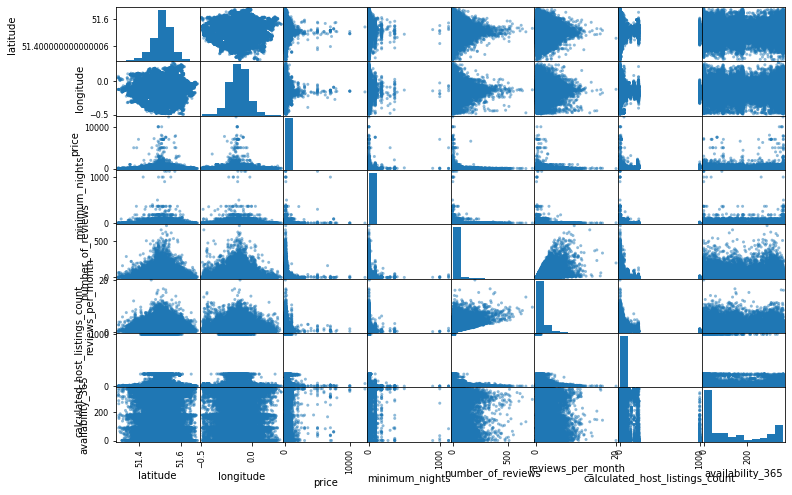

In [12]:
pd.plotting.scatter_matrix(df[numericas], figsize=(12,8))

([<matplotlib.patches.Wedge at 0x281d73c10>,
 [Text(1.0317592625608707, 0.38140899847781323, ''),
  Text(0.5825252853319608, 0.93309393522245, ''),
  Text(0.023965907351831277, 1.0997388941402426, ''),
  Text(-0.46078948017158816, 0.9988358498588233, ''),
  Text(-0.8443177227776593, 0.7050727501496196, ''),
  Text(-1.0551379583199592, 0.3109403301477448, ''),
  Text(-1.096234991384006, -0.09093318242153914, ''),
  Text(-0.9939481339671876, -0.4712399675145837, ''),
  Text(-0.7821999433229436, -0.7734101425929091, ''),
  Text(-0.5058143212191248, -0.9768069780922105, ''),
  Text(-0.24836436182858768, -1.0715946732666595, ''),
  Text(-0.05319588523521146, -1.0987129733438312, ''),
  Text(0.12900674796831735, -1.092408924798145, ''),
  Text(0.2945376429615041, -1.0598337496412735, ''),
  Text(0.43642124259947634, -1.0097210005778474, ''),
  Text(0.559646244657278, -0.9469931788777606, ''),
  Text(0.6710064896410766, -0.8716365589278366, ''),
  Text(0.7657765229057992, -0.7896748172294112,

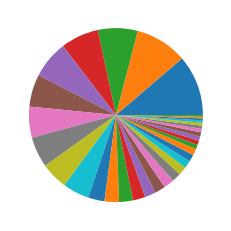

In [13]:
#Vecindarios más visitados
plt.pie(df_londres["neighbourhood"].value_counts())

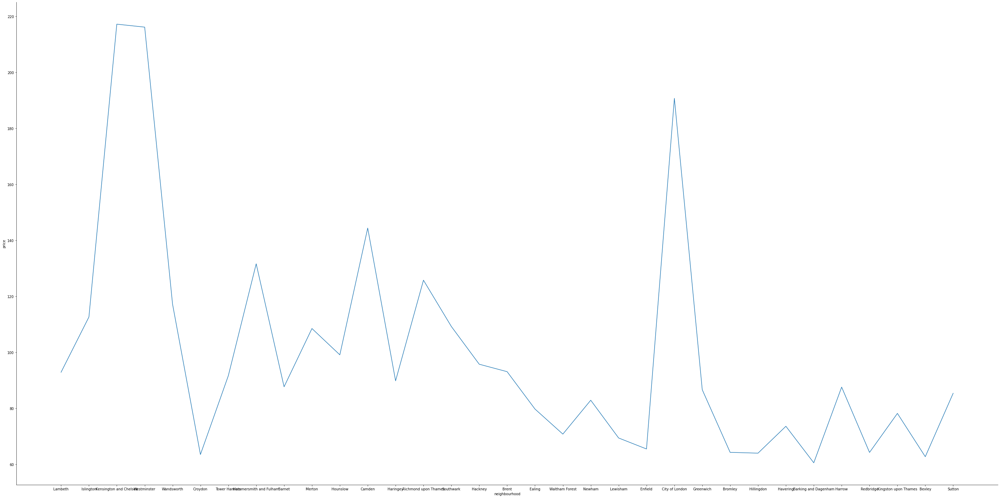

In [14]:
#De acuerdo al vecindario se estima el precio del alojamiento. 
sns.relplot(x="neighbourhood", y="price", ci=None, kind="line", data=df_londres, aspect=2, height=20)

Se observa:
+ Los alojamientos que se aproximan a los 220 por noche se encuentran en Lambeth,Islington, Kensington y Chelsea, Westminster y Wandsworth.
+ Los alojamientos que se aproximan a los 200 por noche se encuentran en Enfield, City of London y Greenwich.
+ En el resto de lugares el costo de alojamiento se encuentran en el rango de 60 a 160 por noche.

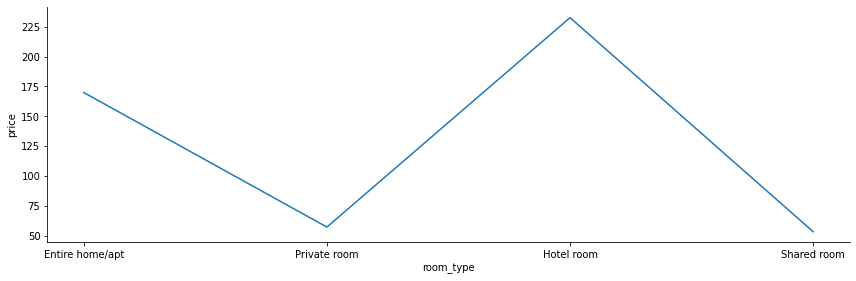

In [15]:
#De acuerdo al tipo de habitación se estima el precio del alojamiento. 
sns.relplot(x="room_type", y="price", ci=None, kind="line", data=df_londres, aspect=3, height=4)

Se observa:
+ Las habitaciones de hotel son de mayor costo y le sigue los alquileres de casa o apartamento.
+ Mientras las habitaciones compartidas o privadas son de menor costo. 

<AxesSubplot:xlabel='neighbourhood', ylabel='price'>

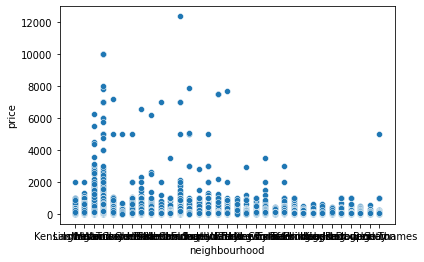

In [16]:
sns.scatterplot(data=df, x="neighbourhood", y="price")

array([[<AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'price'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'number_of_reviews'}>,
        <AxesSubplot:title={'center':'reviews_per_month'}>],
       [<AxesSubplot:title={'center':'calculated_host_listings_count'}>,
        <AxesSubplot:title={'center':'availability_365'}>,
        <AxesSubplot:>]], dtype=object)

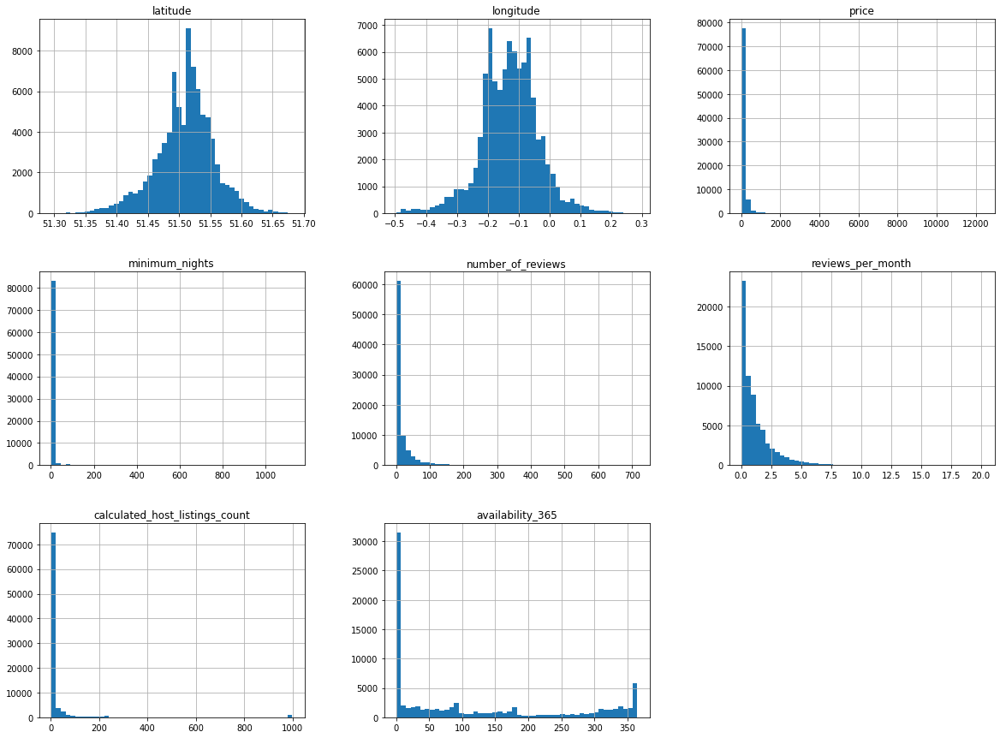

In [17]:
df[numericas].hist(bins=50, figsize=(20,15))

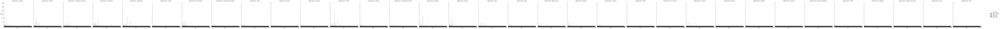

In [18]:
sns.catplot(x ='price', hue ='room_type', kind ='count', col ='neighbourhood', data = df)

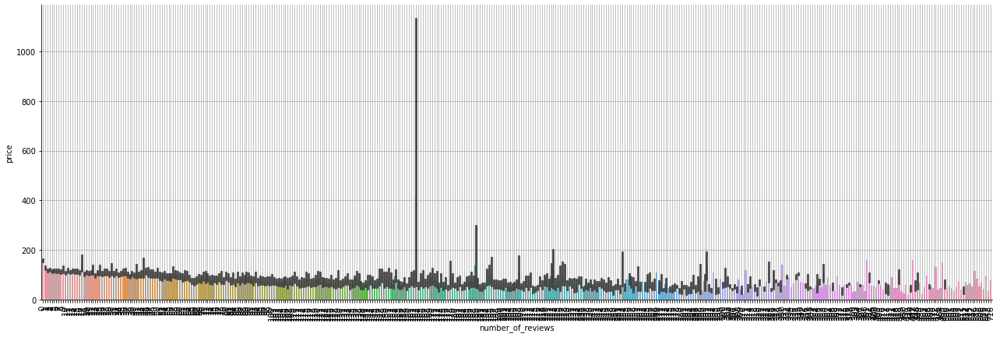

In [19]:
sns.catplot(x="number_of_reviews", y="price", data=df_londres, kind="bar", aspect=3, height=6)
plt.xticks(rotation=90)
plt.grid(axis='x')
plt.grid(axis='y')
plt.show()

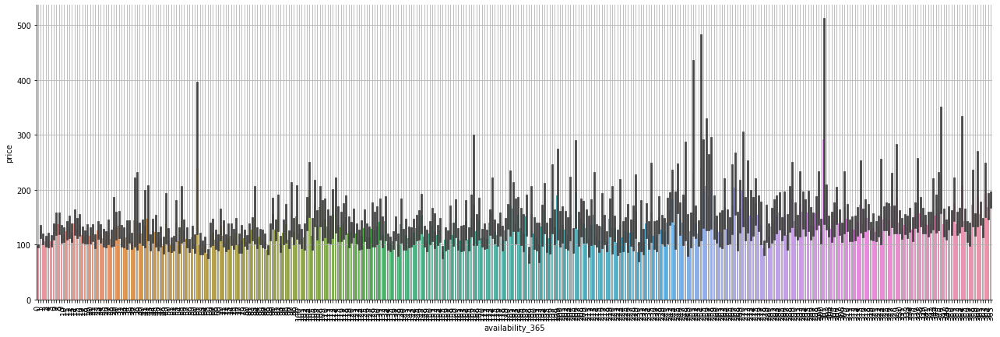

In [20]:
sns.catplot(x="availability_365", y="price", data=df_londres, kind="bar", aspect=3, height=6)
plt.xticks(rotation=90)
plt.grid(axis='x')
plt.grid(axis='y')
plt.show()

<AxesSubplot:xlabel='latitude', ylabel='longitude'>

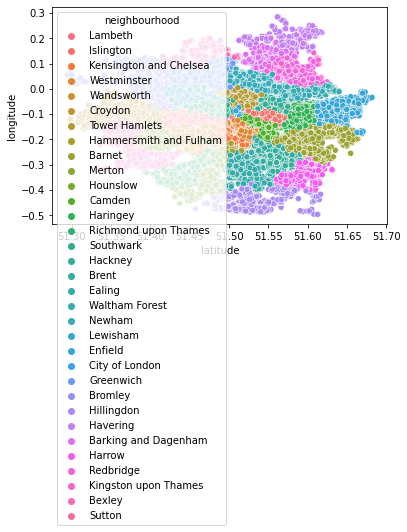

In [21]:
sns.scatterplot(data=df_londres, x="latitude", y="longitude", hue="neighbourhood")

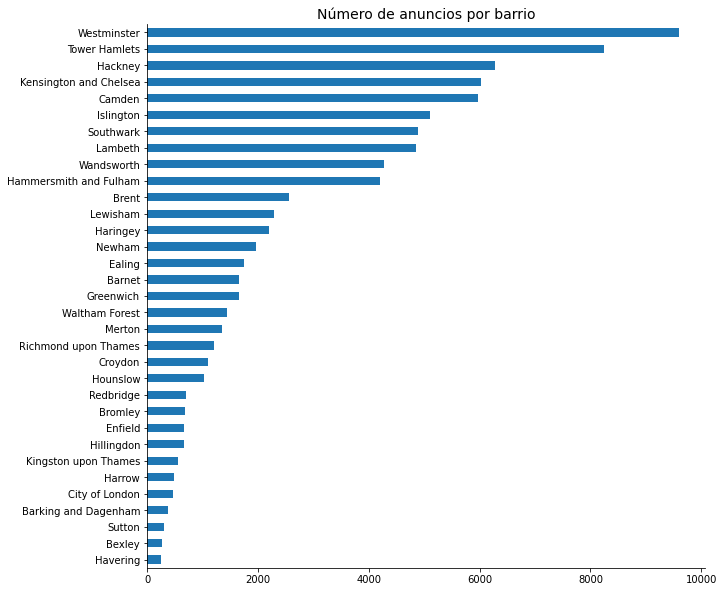

In [22]:
df['neighbourhood'].value_counts().sort_values().plot.barh(figsize=(10, 10));
sns.despine()
plt.title('Número de anuncios por barrio', fontsize=14);

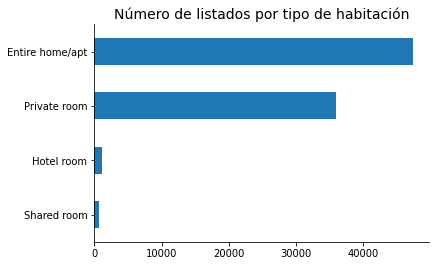

In [23]:
df['room_type'].value_counts(dropna=False).sort_values().plot.barh()
sns.despine()
plt.title('Número de listados por tipo de habitación', fontsize=14);

In [25]:
df2 = df[['longitude', 'latitude']]
df2.head()


,longitude,latitude
0,-0.11732,51.46225
1,-0.11121,51.56802
2,-0.19853,51.51074
3,-0.16898,51.48796
4,-0.08547,51.55071


In [26]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

<AxesSubplot:>

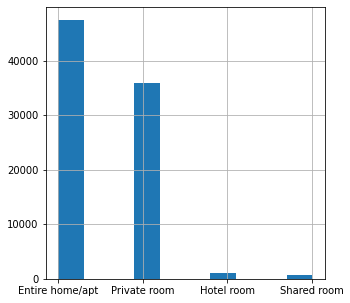

In [27]:
df.room_type.hist(figsize=(5,5))
#figsize 调整图片整体的大小 切勿输入大数值

In [28]:
# df.room_type.hist( )
# ???? 调整刻度 how to do attention: This code doesn't work. I put here just for solving it.

In [29]:
df['room_type'].value_counts()

Entire home/apt    47445
Private room       35882
Hotel room          1113
Shared room          628
Name: room_type, dtype: int64

In [30]:
(df['room_type'].value_counts()).to_frame()

,room_type
Entire home/apt,47445
Private room,35882
Hotel room,1113
Shared room,628


In [31]:
(df['neighbourhood'].value_counts()).to_frame(name="count")

,count
Westminster,9588
Tower Hamlets,8246
Hackney,6276
Kensington and Chelsea,6018
Camden,5972
Islington,5108
Southwark,4893
Lambeth,4854
Wandsworth,4272
Hammersmith and Fulham,4210


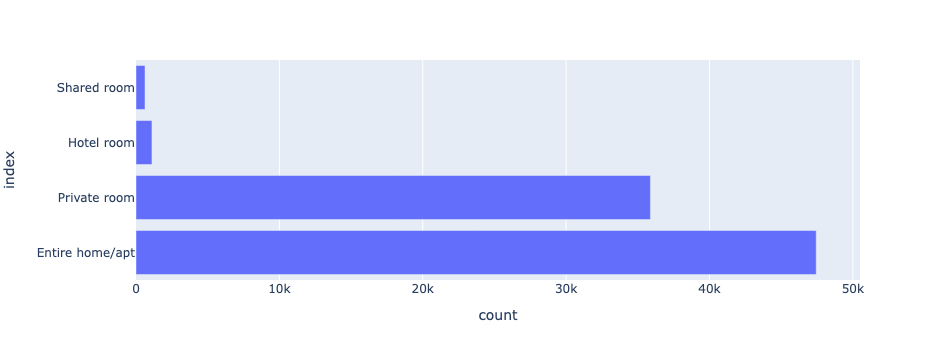

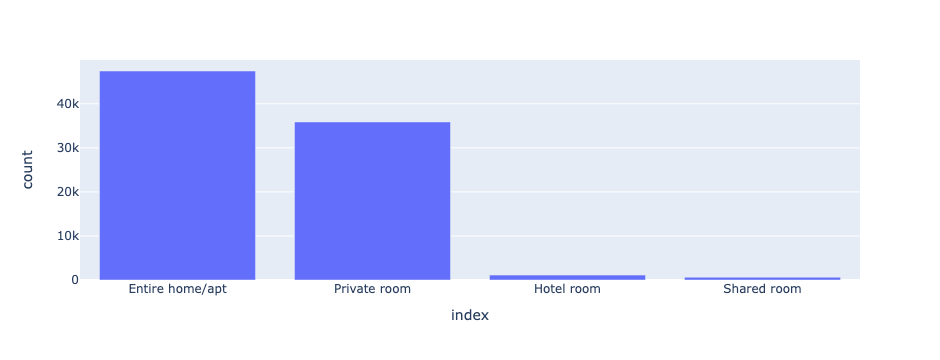

In [227]:
import plotly.express as px
fig = px.bar((df['room_type'].value_counts()).to_frame(name="count"), x="count")
fig.show()

import plotly.express as px
fig = px.bar((df['room_type'].value_counts()).to_frame(name="count"), y="count")
fig.show()

In [236]:
import pydeck

layer = pydeck.Layer(
    'HexagonLayer',
    df2,
    get_position=['longitude', 'latitude'],
    auto_highlight=True,
    elevation_scale=50,
    pickable=True,
    elevation_range=[0, 3000],
    extruded=True,
    coverage=1)

view_state = pdk.ViewState(
    longitude=-1.415,
    latitude=52.2323,
    zoom=6,
    min_zoom=5,
    max_zoom=15,
    pitch=40.5,
    bearing=-27.36)

# Combined all of it and render a viewport
r = pdk.Deck(layers=[layer], initial_view_state=view_state)
r.to_html('london.html')
# I spent two hours solving the problems of this map. Finally, it works well. Jajajajaja

In [238]:
# import pydeck as pdk
# Still working on solving the problems of this picture.
# base64-encoded image string of a red dot
# Doesn't work the convert of the picture .jpg to base 64
#IMG_URL = '"data:hehua.jpeg;base64,iVBORw0KGgoAAAANSUhEUgAAAAUAAAAFCAYAAACNbyblAAAAHElEQVQI12P4//8/w38GIAXDIBKE0DHxgljNBAAO9TXL0Y4OHwAAAABJRU5ErkJggg=="'
# Specifies the corners of the image bounding box
BOUNDS = [
    [-122.52690000000051, 37.70313158980733],
    [-122.52690000000051, 37.816395657523195],
    [-122.34604834372873, 37.816134829424335],
    [-122.34656848822227, 37.70339041384273],
]

# bitmap_layer = pdk.Layer("BitmapLayer", data=None, image=IMG_URL, bounds=BOUNDS, opacity=0.7)

# view_state = pdk.ViewState(latitude=37.7576171, longitude=-122.5776844, zoom=10, bearing=-45, pitch=60,)

# r = pdk.Deck(bitmap_layer, initial_view_state=view_state, map_style=pdk.map_styles.SATELLITE)

# r.to_html()

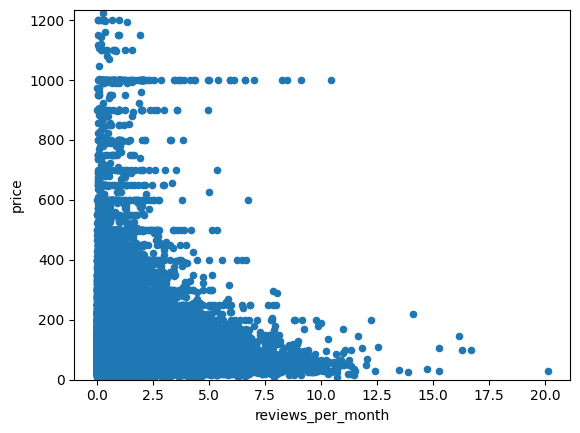

In [257]:
var = 'reviews_per_month'
data = pd.concat([df['price'], df[var]], axis=1)
data.plot.scatter(x=var, y='price', ylim=(0,1234));

<AxesSubplot:xlabel='price', ylabel='Count'>

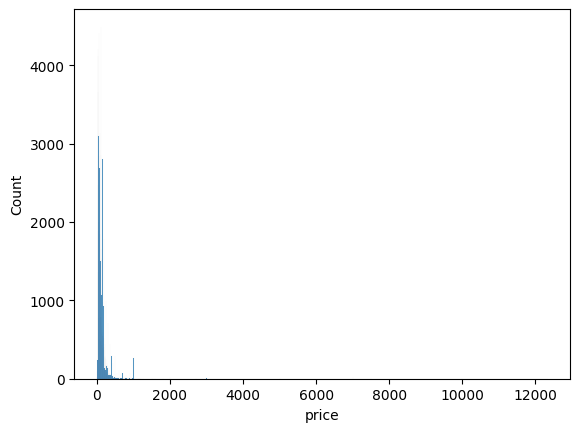

In [139]:
sns.histplot(df["price"])

<AxesSubplot:xlabel='price', ylabel='minimum_nights'>

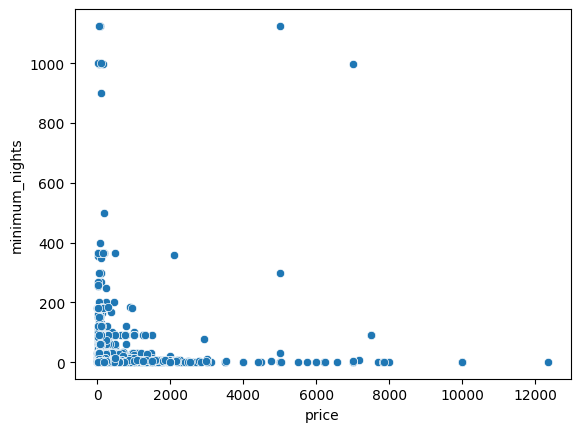

In [39]:
sns.scatterplot(x='price',y='minimum_nights',data=df)

<AxesSubplot:xlabel='neighbourhood', ylabel='count'>

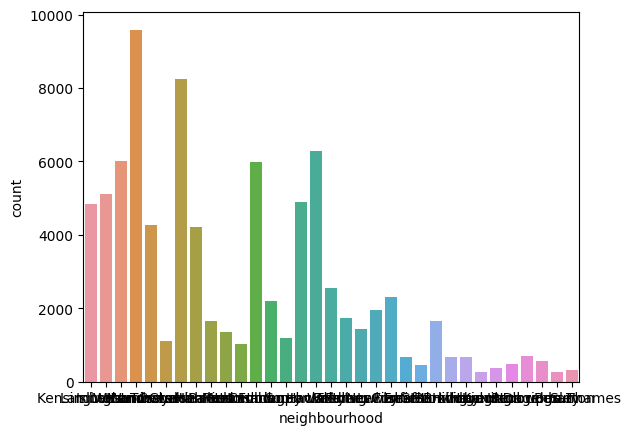

In [250]:
import warnings
warnings.filterwarnings("ignore")

sns.countplot(df["neighbourhood"])


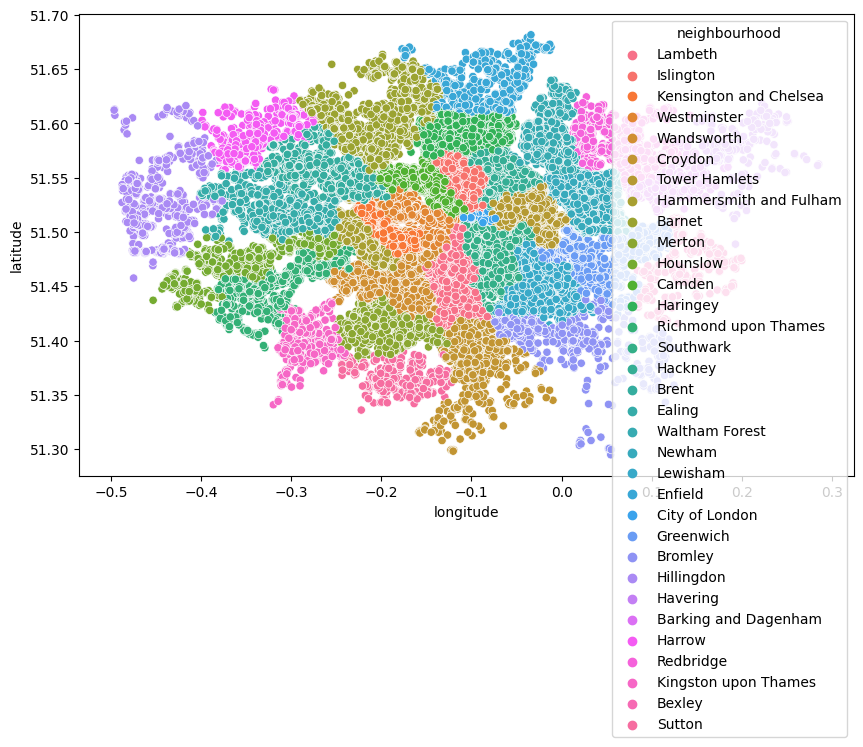

In [248]:
import warnings
warnings.filterwarnings("ignore")
plt.figure(figsize=(10,6))
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood)
plt.ioff()

In [44]:
import folium
from folium.plugins import HeatMap
m=folium.Map([51.0260617, -1.3993741],zoom_start=17)
HeatMap(df[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

In [52]:
import pydeck
import pandas
data = pandas.DataFrame([
    {
        'site': 'Big Ben',
        'attraction_type': 'Clock Tower',
        'lat': 51.5006958,
        'lng': -0.1266639
    },
    {
        'site': 'Kensington Palace',
        'attraction_type': 'Palace',
        'lat': 51.5046188,
        'lng': -0.1839472
    },
    {
        'attraction_type': 'Palace',
        'site': 'Buckingham Palace',
        'lat': 51.501364,
        'lng': -0.14189
    }
])
color_lookup = pydeck.data_utils.assign_random_colors(data['attraction_type'])
# Assign a color based on attraction_type
data['color'] = data.apply(lambda row: color_lookup.get(row['attraction_type']), axis=1)
# Data now has an RGB color by attraction type:
[
  {
        'site': 'Big Ben',
        'attraction_type': 'Clock Tower',
        'lat': 51.5006958,
        'lng': -0.1266639,
        'color': [0, 10, 35]
    },
    {
        'site': 'Kensington Palace',
        'attraction_type': 'Palace',
        'lat': 51.5046188,
        'lng': -0.1839472,
        'color': [53, 243, 130]
    },
  {
        'attraction_type': 'Palace',
        'site': 'Buckingham Palace',
        'lat': 51.501364,
        'lng': -0.14189,
        'color': [53, 243, 130]
    }
]

[{'site': 'Big Ben',
  'attraction_type': 'Clock Tower',
  'lat': 51.5006958,
  'lng': -0.1266639,
  'color': [0, 10, 35]},
 {'site': 'Kensington Palace',
  'attraction_type': 'Palace',
  'lat': 51.5046188,
  'lng': -0.1839472,
  'color': [53, 243, 130]},
 {'attraction_type': 'Palace',
  'site': 'Buckingham Palace',
  'lat': 51.501364,
  'lng': -0.14189,
  'color': [53, 243, 130]}]

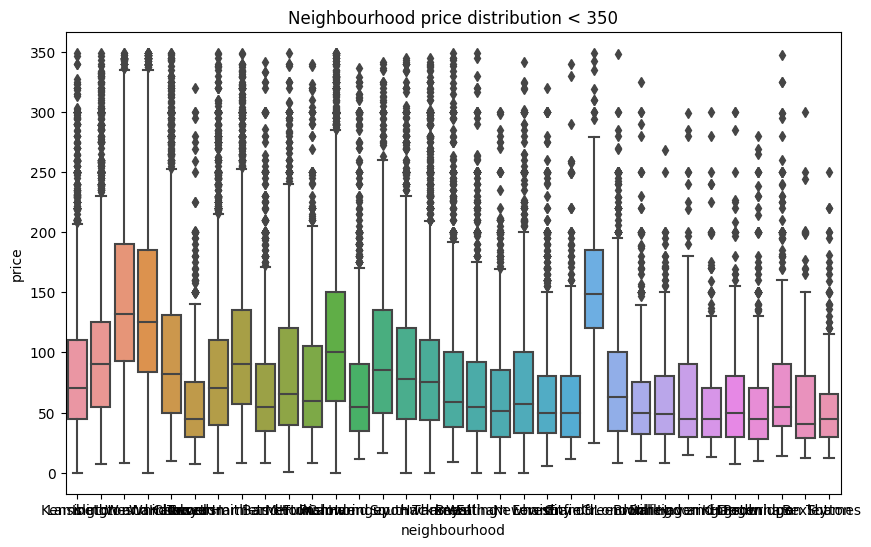

In [267]:
ng = df[df.price <350]
plt.figure(figsize=(10,6))
sns.boxplot(y="price",x ='neighbourhood' ,data = ng)
plt.title("Neighbourhood price distribution < 350")
plt.show()

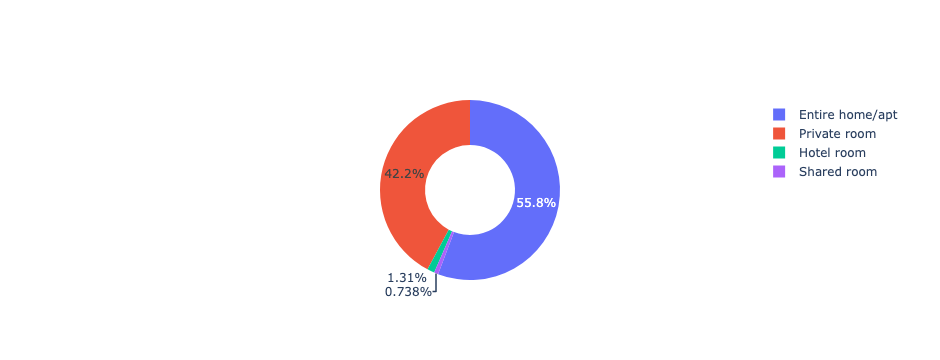

In [266]:
import plotly.offline as pyo
import plotly.graph_objs as go
roomdf = df.groupby('room_type').size()/df['room_type'].count()*100
labels = roomdf.index
values = roomdf.values

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5)])
fig.show()

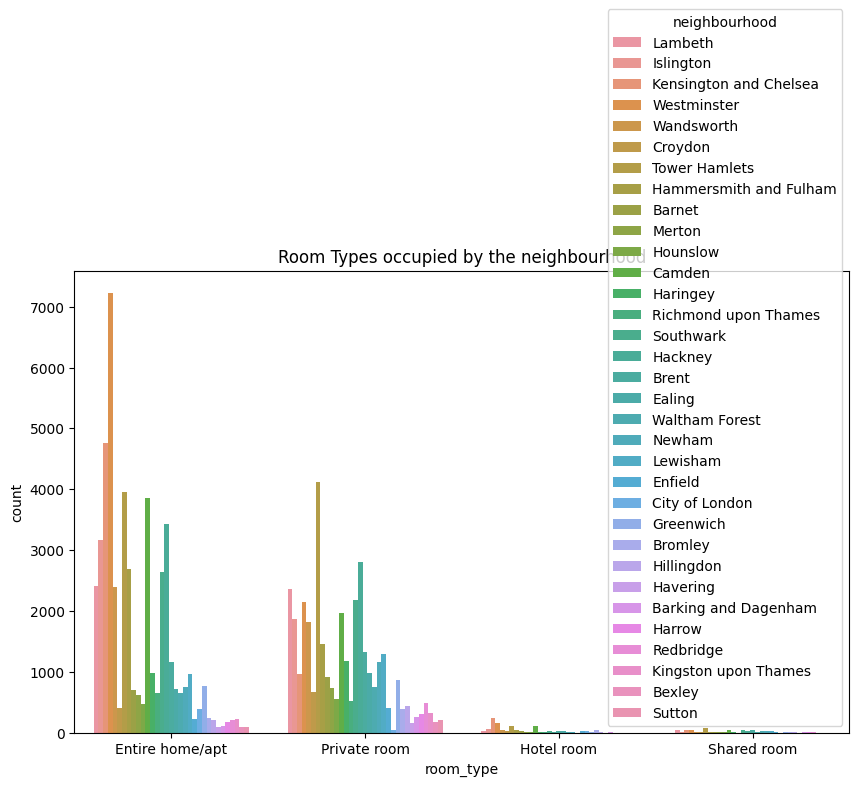

In [80]:
plt.figure(figsize=(10,6))
sns.countplot(x = 'room_type',hue = "neighbourhood",data = df)
plt.title("Room Types occupied by the neighbourhood")
plt.show()

<Figure size 1000x600 with 0 Axes>

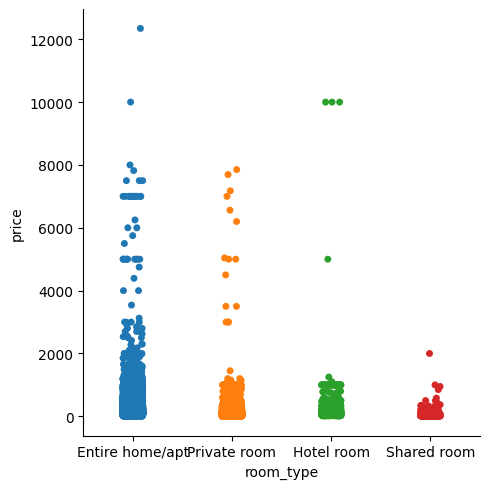

In [81]:
#catplot room type and price 房间类型和价格
plt.figure(figsize=(10,6))
sns.catplot(x="room_type", y="price", data=df);
plt.ioff()

<Figure size 1000x600 with 0 Axes>

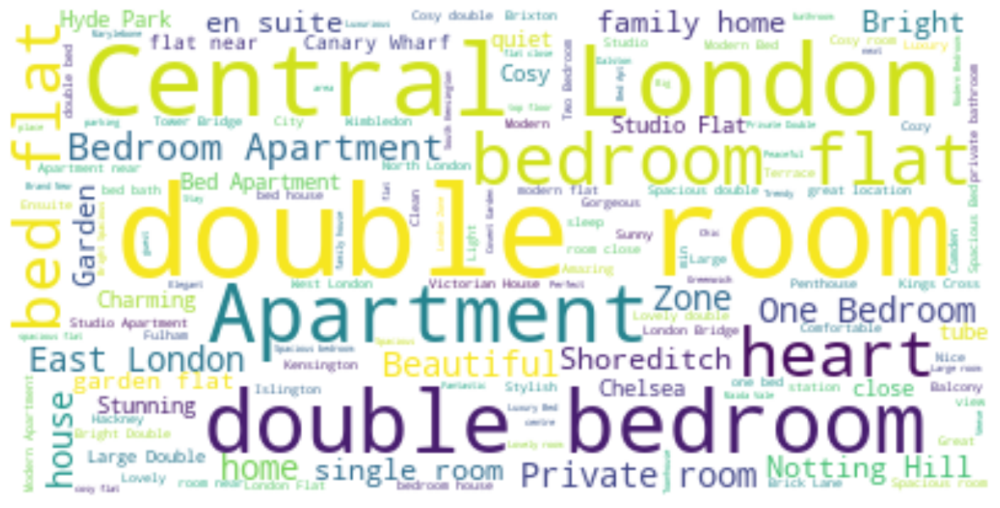

In [93]:
from wordcloud import WordCloud, ImageColorGenerator
text = " ".join(str(each) for each in df.name)
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=200, background_color="white").generate(text)
plt.figure(figsize=(10,6))
plt.figure(figsize=(15,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='Bilinear')
plt.axis("off")
plt.show()

<Figure size 1000x600 with 0 Axes>

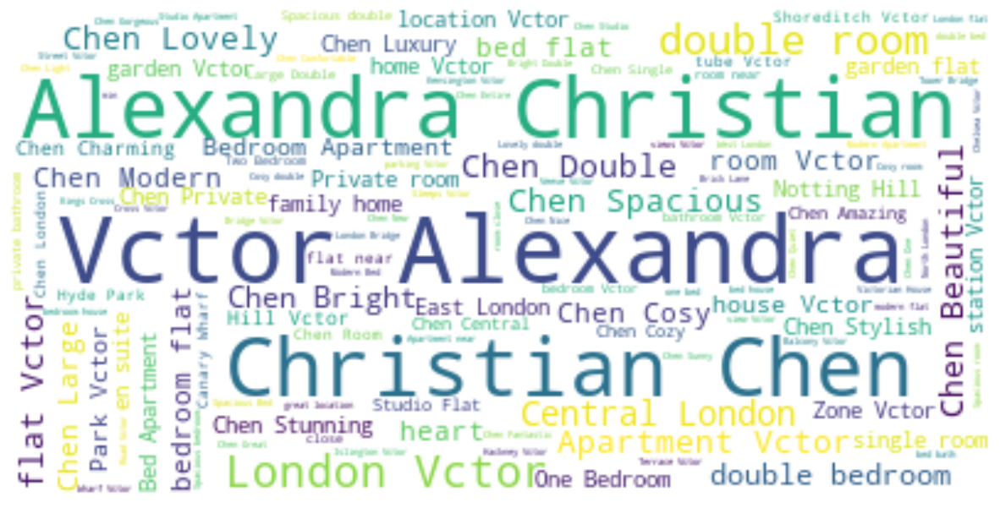

In [113]:
from wordcloud import WordCloud, ImageColorGenerator
text = " , ,Vctor,Alexandra,Christian,Chen,".join(str(each) for each in df.name)
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=200, background_color="white").generate(text)
plt.figure(figsize=(10,6))
plt.figure(figsize=(15,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='Bilinear')
plt.axis("off")
plt.show()

In [242]:
df1=df.sort_values(by=['number_of_reviews'],ascending=False).head(1000)
df1.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2550,1436172,Cosy Dble in Kings Cross Houseshare,7716401,Paul,NaN,Camden,51.53105,-0.12569,Private room,79,1,716,2019-10-27,9.58,4,290
12507,9046849,"Near HEATHROW AIRPORT, London, double room.",47205373,Ekaterina,NaN,Hillingdon,51.50517,-0.47408,Private room,33,1,658,2019-10-20,13.50,1,132
2551,1436177,En-suite Dbl @ Kings Cross Houshare,7716401,Paul,NaN,Camden,51.52731,-0.14007,Private room,95,1,627,2019-10-29,8.27,4,307
1426,604185,Lovely Double in Islington Near tube. Zone 2,2990888,Marie,NaN,Islington,51.55406,-0.11737,Private room,44,1,616,2019-10-29,6.98,1,117
2255,1231053,COSY DOUBLE ROOM in the Heart of London | SOHO,6599538,Allen,NaN,Westminster,51.51264,-0.13154,Private room,68,1,606,2019-10-19,7.78,3,331


In [119]:
import folium
from folium.plugins import MarkerCluster
from folium import plugins
print('Habitaciones con mayor número de reseñas')
Long=-0.12569
Lat=51.53105
mapdf1=folium.Map([Lat,Long],zoom_start=10,)

mapdf1_rooms_map=plugins.MarkerCluster().add_to(mapdf1)

for lat,lon,label in zip(df1.latitude,df1.longitude,df1.name):
    folium.Marker(location=[lat,lon],icon=folium.Icon(icon='home'),popup=label).add_to(mapdf1_rooms_map)
mapdf1.add_child(mapdf1_rooms_map)

mapdf1

Habitaciones con mayor número de reseñas


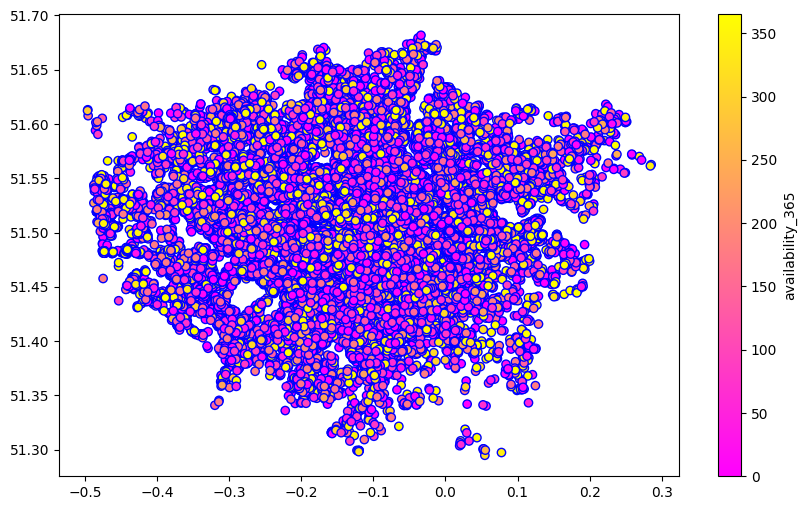

In [122]:
plt.figure(figsize=(10,6))
plt.scatter(df.longitude, df.latitude, c=df.availability_365, cmap='spring', edgecolor='blue', linewidth=1\
            , alpha=1)

cbar = plt.colorbar()
cbar.set_label('availability_365')

<Figure size 1000x600 with 0 Axes>

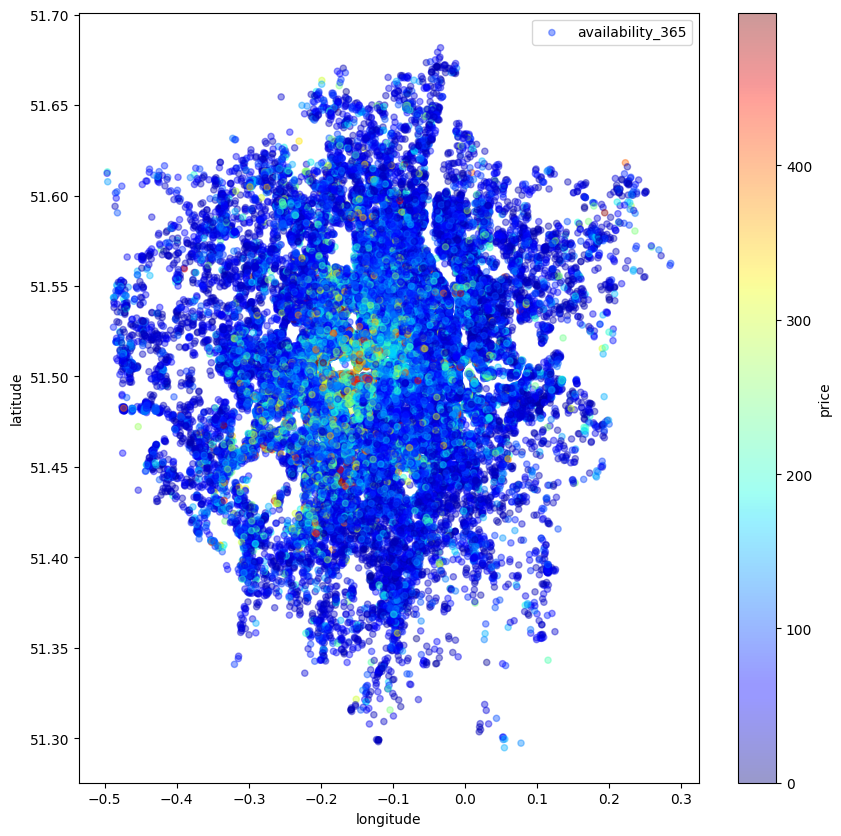

In [123]:
plt.figure(figsize=(10,6))
sub_6=df[df.price<500]
viz_4=sub_6.plot(kind='scatter', x='longitude',y='latitude',label='availability_365',c='price',cmap=plt.get_cmap('jet'),colorbar=True,alpha=0.4,figsize=(10,10))
viz_4.legend()
plt.ioff()
#Los puntos de color rojo son el apartamento o las habitaciones con mayor precio.

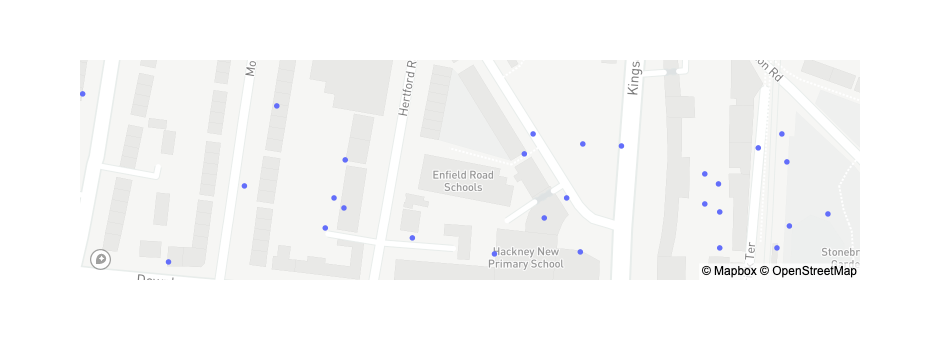

In [157]:
import plotly.express as px
token = 'pk.eyJ1Ijoid2VubGxhIiwiYSI6ImNsNnhmcjFmcjBzbjQzZHFsNXB3YXc0cHAifQ.Yhi8lAIuVUiXA8TltkAMIw'
px.set_mapbox_access_token(token)

fig = px.scatter_mapbox(df,
                        lat=df['latitude'],
                        lon=df['longitude'],
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=15,
                        zoom=9
                       )
fig.show()

# The map which chose by Alex from Plotlt official web, needs token and works well only with token.

In [272]:
df.head()


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365
2,90700,Sunny Notting Hill flat & terrace,491286,Chil,NaN,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268
3,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158
4,92399,"MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...",497366,Andrea & Mark,NaN,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336


In [180]:
# layer = pdk.Layer(
    'ScatterplotLayer',     # Change the `type` positional argument here
    df,
    get_position=['lng', 'lat'],
    auto_highlight=True,
    get_radius=1000,          # Radius is given in meters
    get_fill_color=[180, 0, 200, 140],  # Set an RGBA value for fill
    pickable=True)
    # Problem solving 

In [33]:
df3 = df[["longitude"]]
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85068 entries, 0 to 85067
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   longitude  85068 non-null  float64
dtypes: float64(1)
memory usage: 664.7 KB


In [34]:
df4 = df[["latitude"]]
df4.head()

,latitude
0,51.46225
1,51.56802
2,51.51074
3,51.48796
4,51.55071


In [35]:
df2.head()

,longitude,latitude
0,-0.11732,51.46225
1,-0.11121,51.56802
2,-0.19853,51.51074
3,-0.16898,51.48796
4,-0.08547,51.55071


In [ ]:
type(df3["longitude"][0])

In [ ]:
point = str(df4["latitude"][0])+","+str(df3["longitude"][0])
print(point)
print(location.address)

In [323]:
df3.shape

(85068, 1)

In [324]:
df4.shape

(85068, 1)

In [36]:
addresses = []
for i in range(10):
    point = str(df4["latitude"][i])+","+str(df3["longitude"][i])
    location = geolocator.reverse(point)
    addresses.append(location.address)


In [ ]:
addresses

In [ ]:
df["Address name"]=addresses

In [337]:
dften = df.head(10)
dften

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365
2,90700,Sunny Notting Hill flat & terrace,491286,Chil,NaN,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268
3,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158
4,92399,"MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...",497366,Andrea & Mark,NaN,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336
5,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52098,-0.14002,Entire home/apt,300,3,41,2019-06-19,0.39,15,251
6,92644,Twin room,498201,Deirdre,NaN,Wandsworth,51.44004,-0.18755,Private room,42,1,177,2019-08-05,1.73,1,67
7,38151,Double room/ lounge,163634,Lisa,NaN,Croydon,51.41940,-0.08722,Private room,65,1,0,NaN,NaN,1,365
8,25023,All-comforts 2-bed flat near Wimbledon tennis,102813,Amanda,NaN,Wandsworth,51.44687,-0.21874,Entire home/apt,65,90,34,2019-09-15,0.76,1,39
9,38407,Canary Wharf Immaculate Apt for 2,164566,John,NaN,Tower Hamlets,51.49995,-0.02624,Entire home/apt,79,2,137,2017-04-21,1.23,1,5


In [ ]:
dften["Address name"]=addresses
dften


In [339]:
dften["Address name"]=addresses
dften


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,Address name
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336,"8, Shannon Grove, Stockwell, London Borough of..."
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365,"Zasman Vet, Tollington Park, Finsbury Park, Lo..."
2,90700,Sunny Notting Hill flat & terrace,491286,Chil,NaN,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268,Southbank International School (Kensington Cam...
3,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158,"HCA Sydney Street, 102, Sydney Street, Chelsea..."
4,92399,"MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...",497366,Andrea & Mark,NaN,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336,"Hathersage Court, Mildmay Park, Newington Gree..."
5,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52098,-0.14002,Entire home/apt,300,3,41,2019-06-19,0.39,15,251,"University of Westminster, 115, New Cavendish ..."
6,92644,Twin room,498201,Deirdre,NaN,Wandsworth,51.44004,-0.18755,Private room,42,1,177,2019-08-05,1.73,1,67,"36, Skelbrook Street, Earlsfield, London Borou..."
7,38151,Double room/ lounge,163634,Lisa,NaN,Croydon,51.41940,-0.08722,Private room,65,1,0,NaN,NaN,1,365,"55, Central Hill, West Norwood, London Borough..."
8,25023,All-comforts 2-bed flat near Wimbledon tennis,102813,Amanda,NaN,Wandsworth,51.44687,-0.21874,Entire home/apt,65,90,34,2019-09-15,0.76,1,39,"Sandringham Close, Southfields, London Borough..."
9,38407,Canary Wharf Immaculate Apt for 2,164566,John,NaN,Tower Hamlets,51.49995,-0.02624,Entire home/apt,79,2,137,2017-04-21,1.23,1,5,"Clifton Express, 24-30, Westferry Road, Canary..."


In [ ]:
df.columns =[{"name"},{"host_id"},{"id"},{"neighbourhood_group"},{"host_name"},{"neighbourhood"},{"latitude"},{"longitude"},{"address"},{"room_type"},{"price"},{"minimum_nights"},{"number_of_reviews"},{"last_reviews"},{"reviews_per_month"},{"geometry"},{"calculated_host_listings_count"},{"availability_365"}]
df.columns



In [ ]:
dfnew =df[["latitude", "longitude", "address"]] 

In [393]:
df.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry,address
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336,"(51.46225, -0.11732)",LondonUnited KingdomGB
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365,"(51.56802, -0.11121)",LondonUnited KingdomGB


In [386]:
# 测试代码
import reverse_geocode
df['geometry'] = list(zip(df['latitude'],df['longitude']))
df['geometry']

0        (51.46225, -0.11732)
1        (51.56802, -0.11121)
2        (51.51074, -0.19853)
3        (51.48796, -0.16898)
4        (51.55071, -0.08547)
                 ...         
85063    (51.48601, -0.12766)
85064    (51.40628, -0.23244)
85065    (51.50244, -0.21547)
85066     (51.35742, 0.10764)
85067      (51.5109, -0.1248)
Name: geometry, Length: 85068, dtype: object

In [365]:
import reverse_geocode
df['geometry'] = list(zip(df['latitude'],df['longitude']))
loc = reverse_geocode.search(df['geometry'].tolist())
for i in loc:
    df['address'] = i['city'] + i['country'] + i['country_code']
df['address']

0        LondonUnited KingdomGB
1        LondonUnited KingdomGB
2        LondonUnited KingdomGB
3        LondonUnited KingdomGB
4        LondonUnited KingdomGB
                  ...          
85063    LondonUnited KingdomGB
85064    LondonUnited KingdomGB
85065    LondonUnited KingdomGB
85066    LondonUnited KingdomGB
85067    LondonUnited KingdomGB
Name: address, Length: 85068, dtype: object

In [391]:
import threading 
import time
  
def print_hello():
  for i in range(4):
    time.sleep(0.5)
    print("Hello")
  
def print_hi(): 
    for i in range(4): 
      time.sleep(0.7)
      print("Hi") 

t1 = threading.Thread(target=print_hello)  
t2 = threading.Thread(target=print_hi)  
t1.start()
t2.start()

Hello
Hi
Hello
Hi
Hello
Hello
Hi
Hi
